<a href="https://colab.research.google.com/github/athanasiagrigoridou/Tomato-Leaf-Diseases-TensorFlow-Object-Detection/blob/main/Detection_SSD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Install TensorFlow Object Detection Dependencies**

In [ ]:
# Clone the tensorflow models repository from GitHub
!pip uninstall Cython -y # Temporary fix for "No module named 'object_detection'" error
!git clone --depth 1 https://github.com/tensorflow/models

Found existing installation: Cython 3.0.10
Uninstalling Cython-3.0.10:
  Successfully uninstalled Cython-3.0.10
Cloning into 'models'...
remote: Enumerating objects: 4107, done.
remote: Counting objects: 100% (4107/4107), done.
remote: Compressing objects: 100% (3109/3109), done.
remote: Total 4107 (delta 1188), reused 2033 (delta 936), pack-reused 0
Receiving objects: 100% (4107/4107), 45.35 MiB | 35.56 MiB/s, done.
Resolving deltas: 100% (1188/1188), done.


In [ ]:
# Copy setup files into models/research folder
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
#cp object_detection/packages/tf2/setup.py .

In [ ]:
# Modify setup.py file to install the tf-models-official repository targeted at TF v2.8.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Install the Object Detection API (NOTE: This block takes about 10 minutes to finish executing)

# Need to do a temporary fix with PyYAML because Colab isn't able to install PyYAML v5.4.1
!pip install pyyaml==5.3
!pip install /content/models/research/

# Need to downgrade to TF v2.8.0 due to Colab compatibility bug with TF v2.10 (as of 10/03/22)
!pip install tensorflow==2.8.0

# Install CUDA version 11.0 (to maintain compatibility with TF v2.8.0)
!pip install tensorflow_io==0.23.1
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!apt-key add /var/cuda-repo-ubuntu1804-11-0-local/7fa2af80.pub
!apt-get update && sudo apt-get install cuda-toolkit-11-0
!export LD_LIBRARY_PATH=/usr/local/cuda-11.0/lib64:$LD_LIBRARY_PATH

Processing ./models/research
  Preparing metadata (setup.py) ... done
  Using cached tensorflow-2.8.4-cp310-cp310-manylinux2010_x86_64.whl (498.1 MB)
INFO: pip is looking at multiple versions of tensorflow to determine which version is compatible with other requirements. This could take a while.
  Using cached tensorflow-2.8.3-cp310-cp310-manylinux2010_x86_64.whl (498.5 MB)
  Using cached tensorflow-2.8.2-cp310-cp310-manylinux2010_x86_64.whl (498.0 MB)
  Using cached tensorflow-2.8.1-cp310-cp310-manylinux2010_x86_64.whl (498.0 MB)
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697352 sha256=b04a656077924f6fd13d07263ce30edf6d5f3f584033ec8327ae717fbf06c224
  Stored in directory: /tmp/pip-ephem-wheel-cache-r0wjiomr/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.

In [ ]:
# Run Model Bulider Test file, just to verify everything's working properly
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py


2024-06-13 12:46:51.403233: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2024-06-13 12:46:51.403274: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
W0613 12:46:51.634199 138013896609792 model_builder.py:1112] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.61s
I0613 12:46:52.019604 138013896609792 test_util.py:2373] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.61s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_mod

# **Upload Image Dataset and Prepare Training Data**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/ColabNotebooks/data.zip /content
!cp /content/gdrive/MyDrive/ColabNotebooks/images.zip /content
!cp /content/gdrive/MyDrive/ColabNotebooks/custom_model_lite.zip /content

Mounted at /content/gdrive


In [2]:
!unzip -q data.zip -d /content
!unzip -q images.zip -d /content
!unzip -q custom_model_lite.zip -d /content

In [3]:
train_record_fname = '/content/data/train.record'
test_record_fname = '/content/data/validation.record'
label_map_pbtxt_fname = '/content/data/label_map.pbtxt'

# **Set Up Training Configuration**

In [ ]:
# Change the chosen_model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },

}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

In [ ]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2024-06-13 12:48:24--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.201.207, 74.125.202.207, 74.125.69.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.201.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  --.-KB/s    in 0.09s   

2024-06-13 12:48:24 (213 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2024-06-13 12:48:24--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199

In [ ]:
# Set training parameters for the model
num_steps = 20000

batch_size = 2

In [ ]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 9


In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)


    f.write(s)


/content/models/mymodel
writing custom configuration file


In [ ]:
# (Optional) Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 9
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

# **Train Custom TFLite Detection Model**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're us

In [ ]:
!zip -r /content/training.zip /content/training/

  adding: content/training/ (stored 0%)
  adding: content/training/ckpt-17.data-00000-of-00001 (deflated 7%)
  adding: content/training/ckpt-16.data-00000-of-00001 (deflated 7%)
  adding: content/training/ckpt-20.data-00000-of-00001 (deflated 7%)
  adding: content/training/ckpt-15.data-00000-of-00001 (deflated 7%)
  adding: content/training/train/ (stored 0%)
  adding: content/training/train/events.out.tfevents.1718282941.6d962fd43978.5872.0.v2 (deflated 0%)
  adding: content/training/ckpt-20.index (deflated 82%)
  adding: content/training/ckpt-15.index (deflated 82%)
  adding: content/training/ckpt-21.index (deflated 82%)
  adding: content/training/ckpt-17.index (deflated 82%)
  adding: content/training/checkpoint (deflated 76%)
  adding: content/training/ckpt-19.data-00000-of-00001 (deflated 7%)
  adding: content/training/ckpt-16.index (deflated 82%)
  adding: content/training/ckpt-18.index (deflated 82%)
  adding: content/training/ckpt-19.index (deflated 82%)
  adding: content/train

# Convert Model to TensorFlow **Lite**

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


2024-06-13 16:08:46.011282: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2024-06-13 16:08:46.011388: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
I0613 16:08:50.673342 137809707671552 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0613 16:08:55.332221 137809707671552 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
2024-06-13 16:08:57.009120: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
I0613 16:08:57.570128 137809707671552 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
W0613 16:08:58.708630 137809707671552 save_

In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

# Test TensorFlow **Model**

In [8]:

def parse_label_map_v2(lblpath):
    labels = []
    with open(lblpath, 'r') as file:
        lines = file.readlines()
        for line in lines:
            if "name:" in line:
                # Extract the class name
                name = line.split(":")[-1].strip().strip("'").strip()
                labels.append(name)
    return labels


In [6]:
import os
import cv2
import numpy as np
import glob
import random
import matplotlib.pyplot as plt
from tensorflow.lite.python.interpreter import Interpreter



def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

    # Grab filenames of all images in test folder
    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

    # Load the label map into memory
    labels = parse_label_map_v2(lblpath)
    print(f"Loaded {len(labels)} labels: {labels}")

    # Load the Tensorflow Lite model into memory
    interpreter = Interpreter(model_path=modelpath)
    interpreter.allocate_tensors()

    # Get model details
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]

    float_input = (input_details[0]['dtype'] == np.float32)

    input_mean = 127.5
    input_std = 127.5

    # Define colors for bounding boxes (different color for each class)
    num_classes = len(labels)
    colors = [[random.randint(0, 255) for _ in range(3)] for _ in range(num_classes)]

    # Randomly select test images
    images_to_test = random.sample(images, num_test_images)

    # Loop over every image and perform detection
    for image_path in images_to_test:

        # Load image and resize to expected shape [1xHxWx3]
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)

        # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std

        # Perform the actual detection by running the model with the image as input
        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        # Retrieve detection results
        boxes = interpreter.get_tensor(output_details[1]['index'])[0]  # Bounding box coordinates of detected objects
        classes = interpreter.get_tensor(output_details[3]['index'])[0].astype(np.int32)  # Class index of detected objects
        scores = interpreter.get_tensor(output_details[0]['index'])[0]  # Confidence of detected objects

        # Initialize variables to keep track of the best detection
        best_score = -1.0
        best_box = None
        best_class_id = -1

        # Loop over all detections to find the highest score
        for i in range(len(scores)):
            if ((scores[i] > min_conf) and (scores[i] <= 1.0)):
                # Get bounding box coordinates
                ymin = int(max(1, (boxes[i][0] * imH)))
                xmin = int(max(1, (boxes[i][1] * imW)))
                ymax = int(min(imH, (boxes[i][2] * imH)))
                xmax = int(min(imW, (boxes[i][3] * imW)))

                # Check if this score is the highest found so far
                if scores[i] > best_score:
                    best_score = scores[i]
                    best_box = (xmin, ymin, xmax, ymax)
                    best_class_id = classes[i]

        # Draw the bounding box of the best detection if found
        if best_score > min_conf:
            # Choose color for the best class
            object_name = labels[best_class_id]
            color = colors[best_class_id]

            # Draw bounding box
            xmin, ymin, xmax, ymax = best_box
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)

            # Draw label
            label = '%s: %d%%' % (object_name, int(best_score * 100))
            font_scale = 0.3  # Decrease font scale for smaller text
            font_thickness = 1
            labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_thickness)
            label_ymin = max(ymin, labelSize[1] + 10)
            cv2.rectangle(image, (xmin, label_ymin - labelSize[1] - 10), (xmin + labelSize[0], label_ymin + baseLine - 10), (255, 255, 255), cv2.FILLED)
            cv2.putText(image, label, (xmin, label_ymin - 7), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), font_thickness)

        # Display or save image results
        if not txt_only:  # Display image results
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(12, 16))
            plt.imshow(image)
            plt.axis('off')
            plt.show()

        elif txt_only:  # Save detection results in .txt files
            image_fn = os.path.basename(image_path)
            base_fn, ext = os.path.splitext(image_fn)
            txt_result_fn = base_fn + '.txt'
            txt_savepath = os.path.join(savepath, txt_result_fn)

            with open(txt_savepath, 'w') as f:
                if best_score > min_conf:
                    f.write('%s %.4f %d %d %d %d\n' % (object_name, best_score, xmin, ymin, xmax, ymax))



Loaded 9 labels: ['Tomato__Tomato_mosaic_virus', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_healthy', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite']


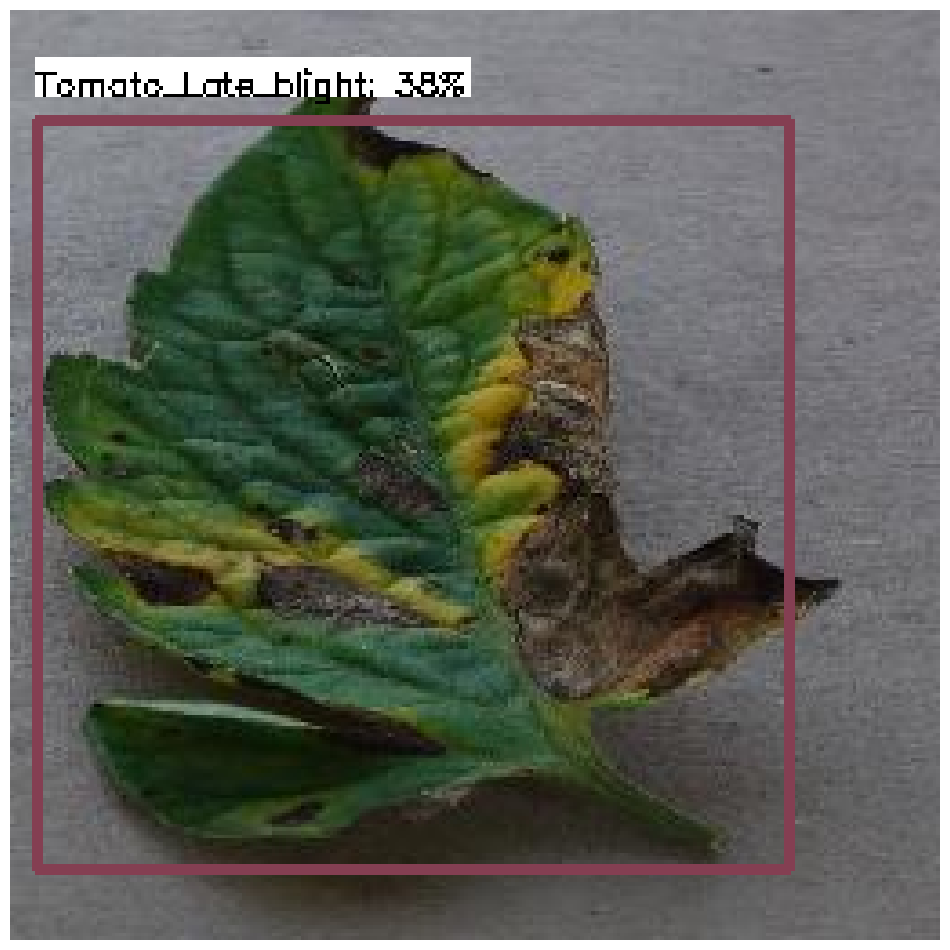

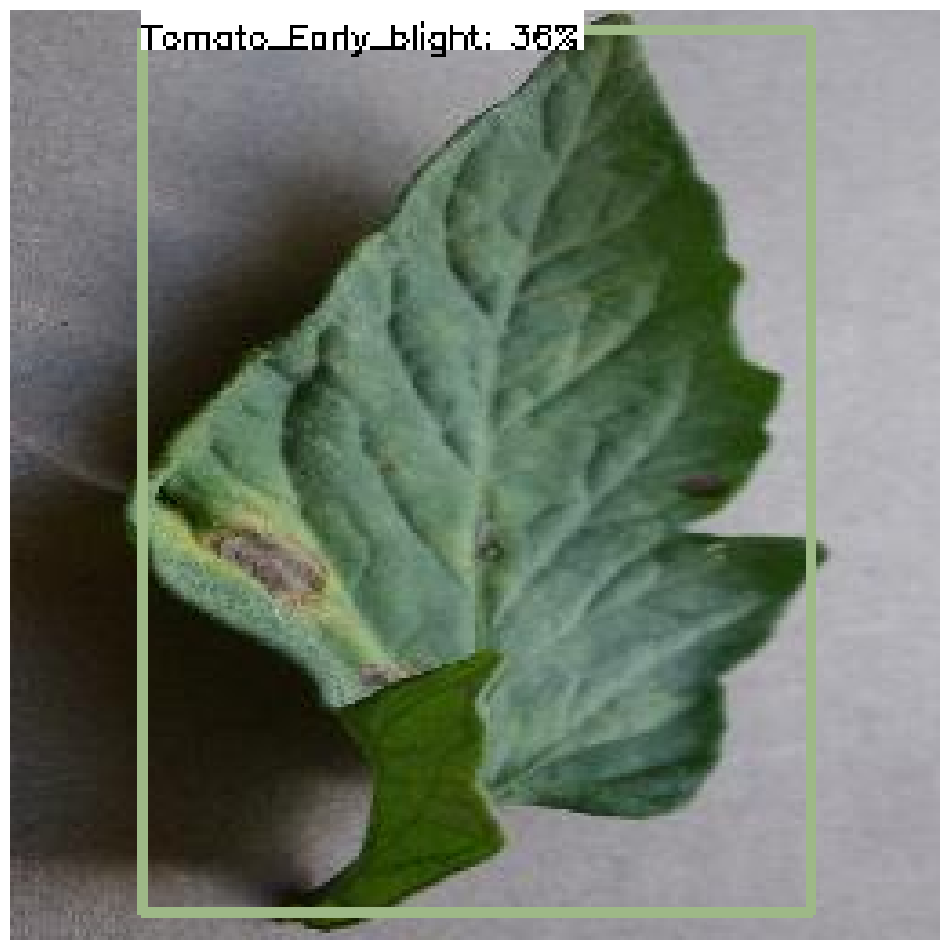

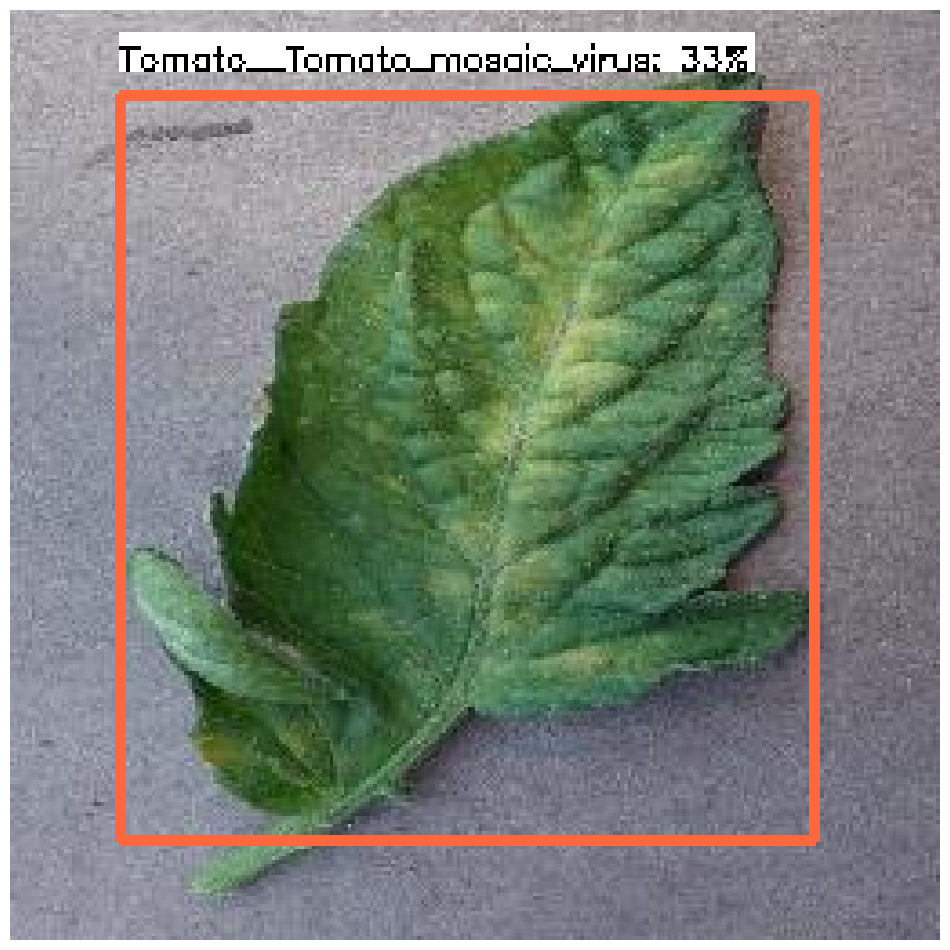

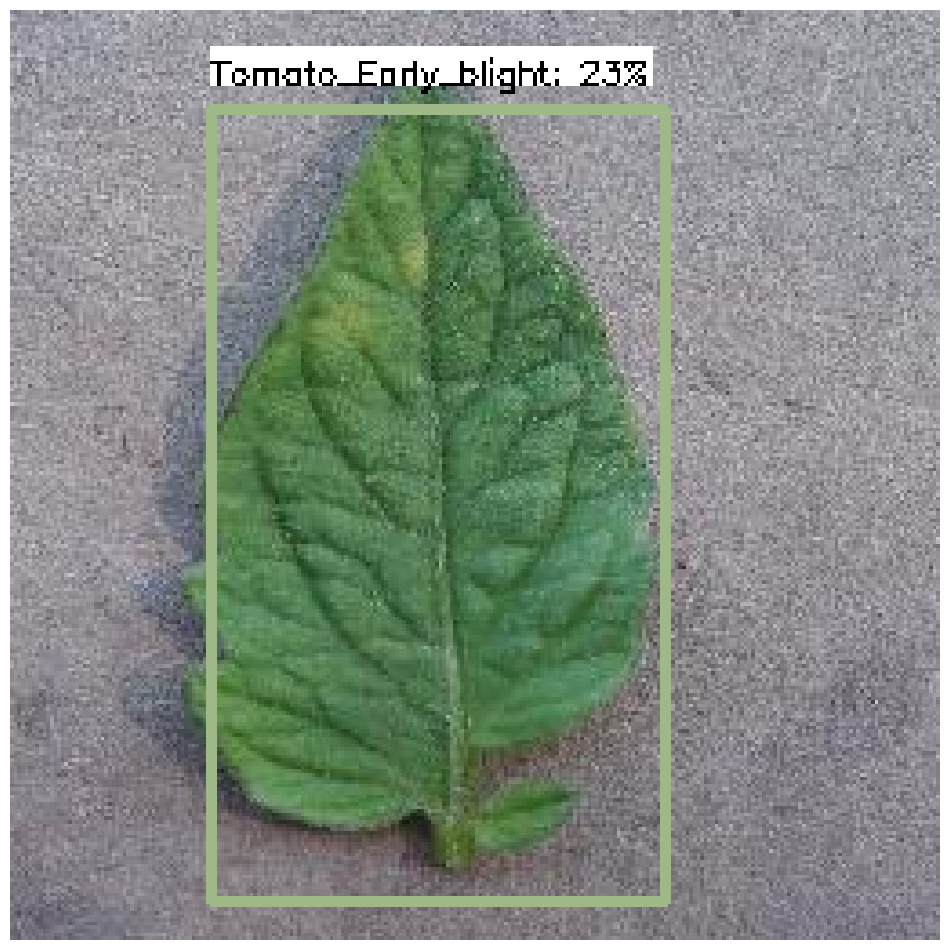

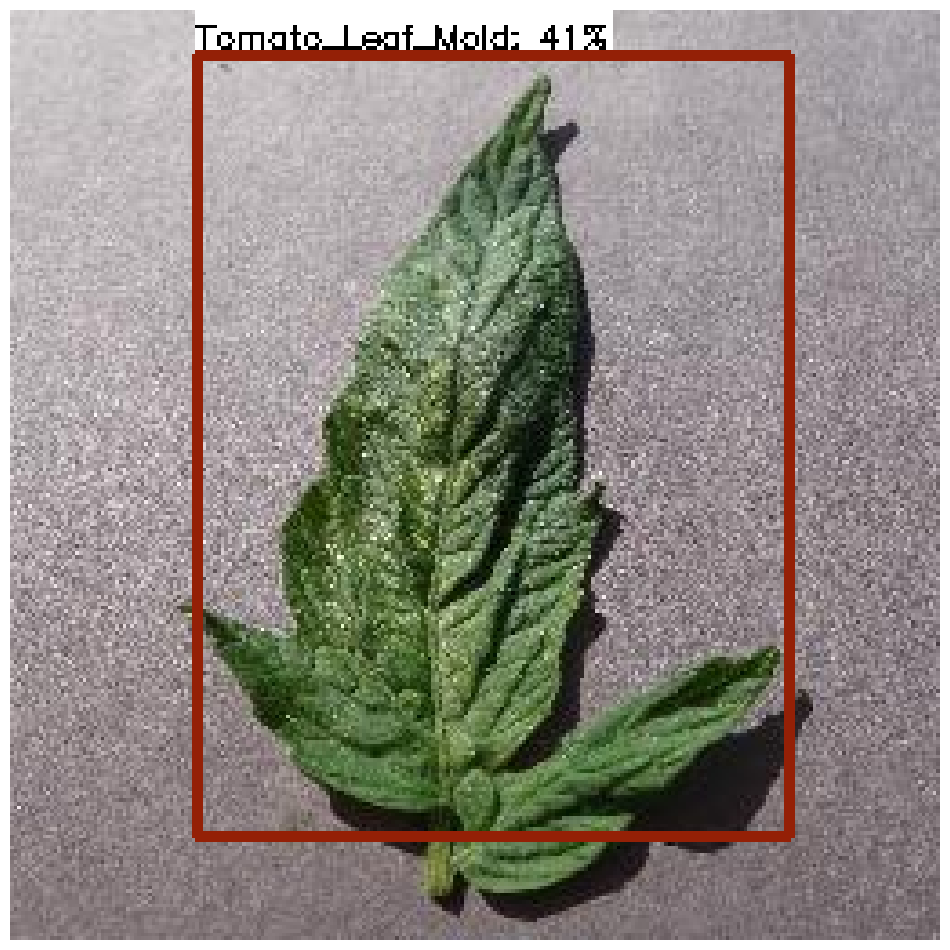

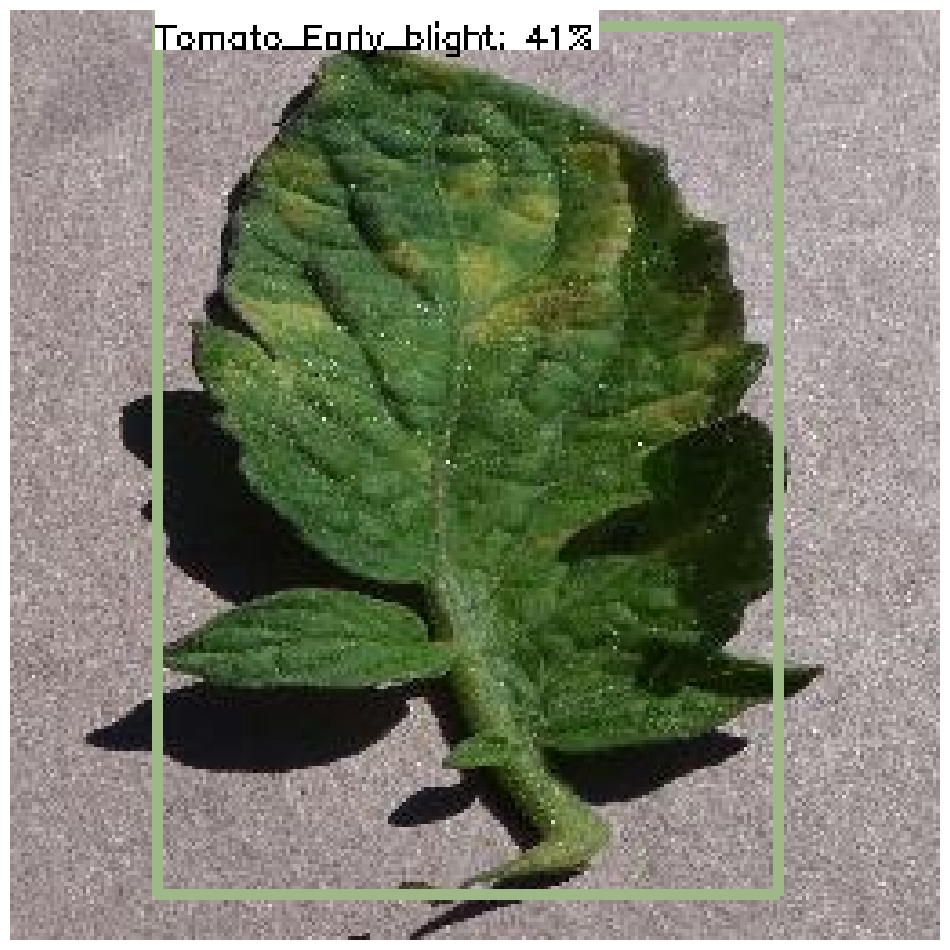

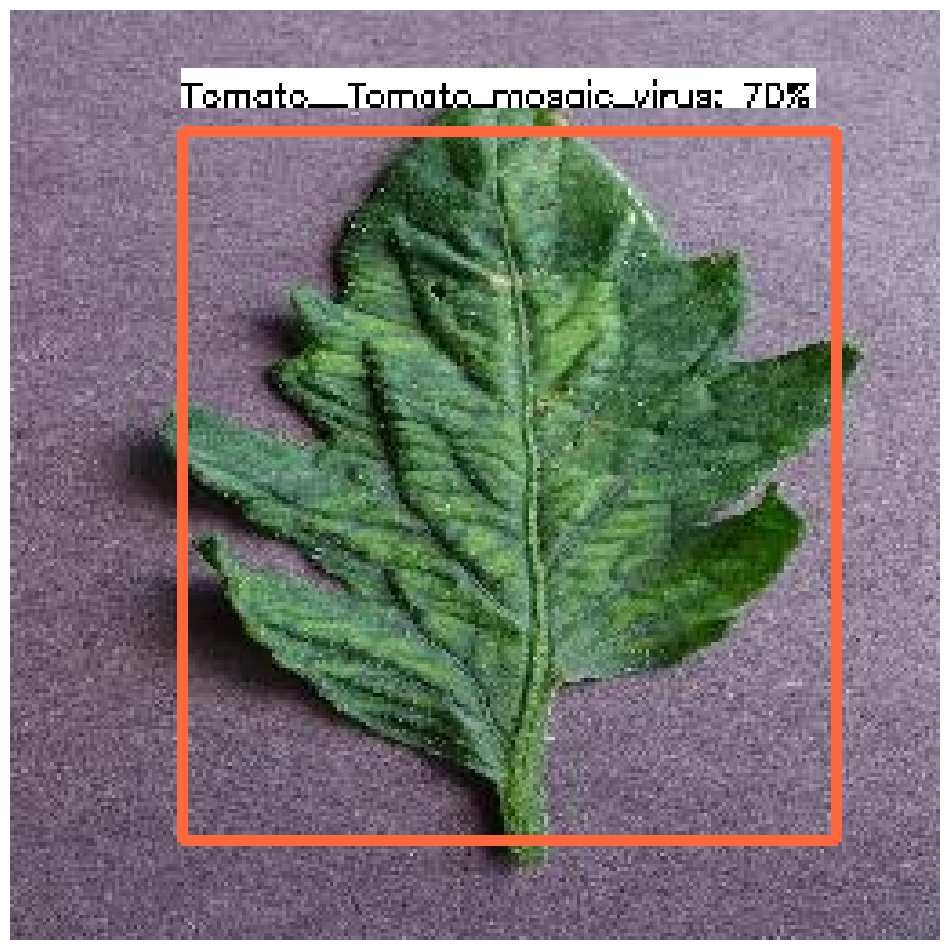

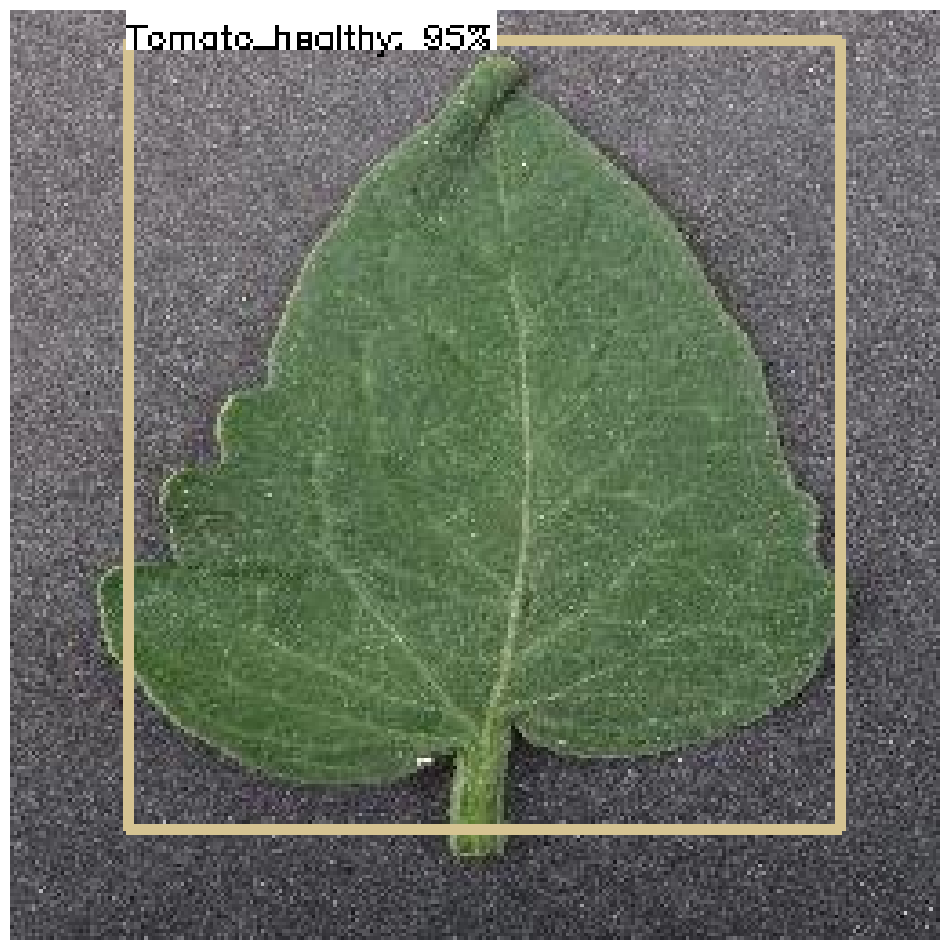

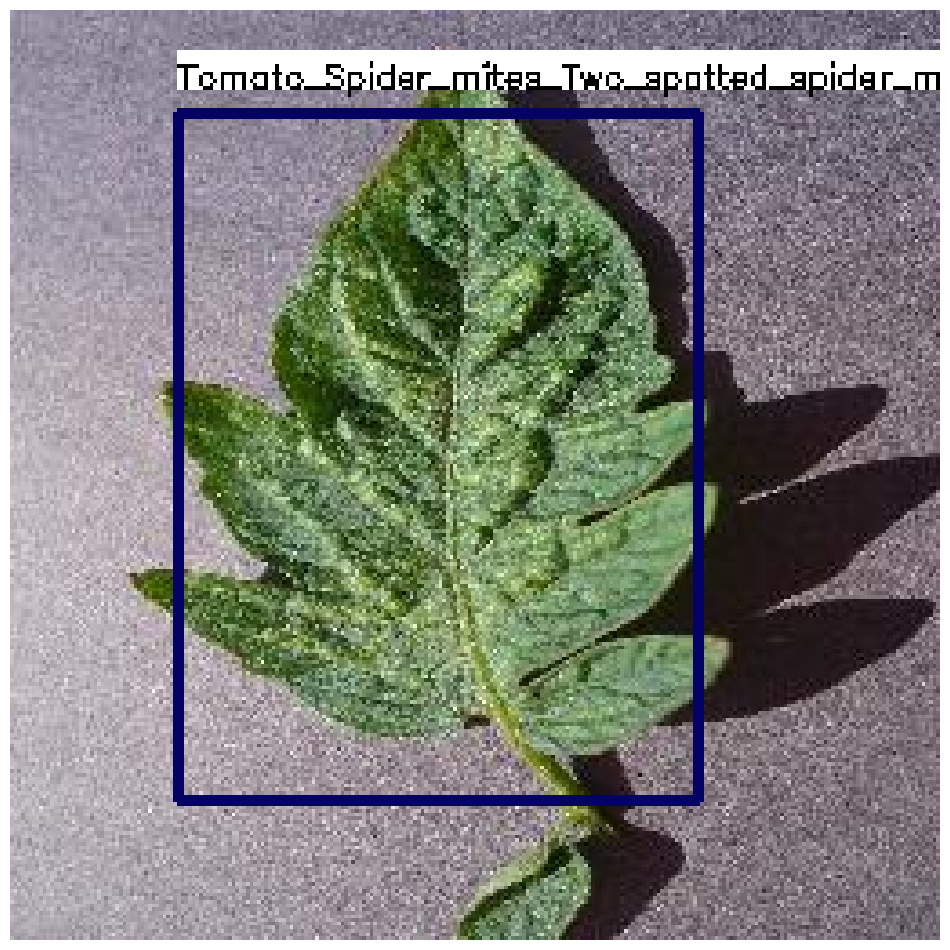

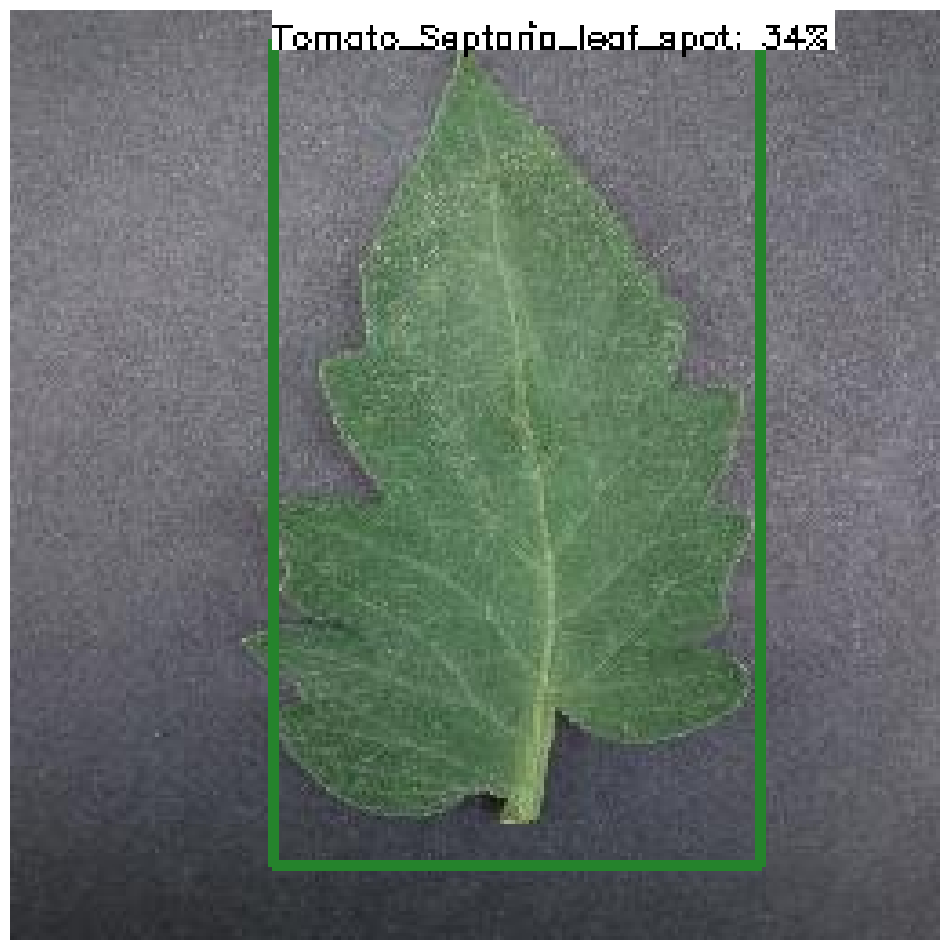

In [7]:
# Set up variables for running user's model
PATH_TO_IMAGES = '/content/images/test'   # Path to test images folder
PATH_TO_MODEL = '/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS = '/content/data/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold = 0.01   # Confidence threshold
images_to_test = 10  # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)








































































































































































































































































































# Calculate **mAP**

In [39]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://github.com/athanasiagrigoridou/Tomato-Leaf-Diseases-TensorFlow-Object-Detection/blob/eb30a52332a258a42a443aeac42f724f637edba1/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2024-06-14 07:42:42--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 33.4M=0s

2024-06-14 07:42:42 (33.4 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



In [40]:
!cp /content/images/test/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

In [41]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


In [42]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/data/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Starting inference on 45 images...
Loaded 9 labels: ['Tomato__Tomato_mosaic_virus', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_healthy', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite']
Finished inferencing!


In [43]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/data/labelmap.txt

/content/mAP
Classes in label map: ['Tomato__Tomato_mosaic_virus', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_healthy', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite']
Calculating mAP at 0.50 IoU threshold...
0.00% = Tomato_Bacterial_spot AP 
4.00% = Tomato_Early_blight AP 
60.00% = Tomato_Late_blight AP 
20.00% = Tomato_Leaf_Mold AP 
47.50% = Tomato_Septoria_leaf_spot AP 
60.00% = Tomato_Spider_mites_Two_spotted_spider_mite AP 
40.00% = Tomato__Tomato_YellowLeaf__Curl_Virus AP 
33.33% = Tomato__Tomato_mosaic_virus AP 
40.00% = Tomato_healthy AP 
mAP = 33.87%
Calculating mAP at 0.55 IoU threshold...
0.00% = Tomato_Bacterial_spot AP 
4.00% = Tomato_Early_blight AP 
60.00% = Tomato_Late_blight AP 
20.00% = Tomato_Leaf_Mold AP 
47.50% = Tomato_Septoria_leaf_spot AP 
60.00% = Tomato_Spider_mites_Two_spotted_spider_mite AP 
40.00% = Tomato__Tomato_YellowLeaf__Curl_Viru

In [44]:
!zip -r /content/mAP.zip /content/mAP/

  adding: content/mAP/ (stored 0%)
  adding: content/mAP/LICENSE (deflated 65%)
  adding: content/mAP/outputs/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.95/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.95/output.txt (deflated 79%)
  adding: content/mAP/outputs/output_iou_0.90/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.90/output.txt (deflated 77%)
  adding: content/mAP/outputs/output_iou_0.70/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.70/output.txt (deflated 75%)
  adding: content/mAP/outputs/output_iou_0.75/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.75/output.txt (deflated 76%)
  adding: content/mAP/outputs/output_iou_0.80/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.80/output.txt (deflated 76%)
  adding: content/mAP/outputs/output_iou_0.50/ (stored 0%)
  adding: content/mAP/outputs/output_iou_0.50/output.txt (deflated 75%)
  adding: content/mAP/outputs/output_iou_0.60/ (stored 0%)
  adding: content/mAP/outputs/ou